# WEEK 3: TEXT EMBEDDING - Word2Vec

Nguyen Luu Phuong Ngoc Lam - 24108

## 1. Preparation

In [ ]:
# Install the necessary packages
!pip install tensorflow tensorboardcolab pyvi -q

DEPRECATION: omegaconf 2.0.6 has a non-standard dependency specifier PyYAML>=5.1.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of omegaconf or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re
from pyvi import ViTokenizer
import gensim
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import tensorflow as tf
from tensorboard.plugins import projector
from gensim.models.phrases import Phrases, Phraser
from collections import Counter
from time import time 
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")


DEPRECATION: omegaconf 2.0.6 has a non-standard dependency specifier PyYAML>=5.1.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of omegaconf or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## 2. Read raw text from data file

In [4]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        file_path = os.path.join(dirname, filename)
        print(file_path)

/kaggle/input/viwik18-dataset/viwik18.txt


In [5]:
with open(file_path, 'r', encoding='utf-8') as file:
    text = file.read()

print(text[:1000]) 

trang chính  internet society  internet society hay isoc là một tổ chức quốc tế hoạt động phi lợi nhuận phi chính phủ và bao gồm các thành viên có trình độ chuyên ngành tổ chức này chú trọng đến tiêu chuẩn giáo dục và các vấn đề về chính sách với trên một bốn năm tổ chức thành viên và sáu năm không không không thành viên cá nhân isoc bao gồm những con người cụ thể trong cộng đồng internet mọi chi tiết có thể tìm thấy tại website của isoc   internet society nằm ở gần thủ đô washington dc hoa kỳ và geneva thụy sĩ số hội viên của nó bao gồm hơn một bốn năm tổ chức thành viên và hơn sáu năm không không không cá nhân thành viên còn có thể tự lập một chi nhánh của tổ chức tùy theo vị trí hoặc sở thích hiện nay tổ chức có tới chín không chi nhánh trên toàn thế giới   nhiệm vụ và mục đích hoạt động  bảo đảm cổ vũ cho sự phát triển mở rộng và sử dụng internet được thuận lợi nhất cho mọi người trên toàn thế giới   xem thêm   lịch sử internet  liên kết ngoài   isoc việt nam  trang chủ toàn cầu  i

### Preprocess data

In [9]:
def preprocessing(text):
    """
    Text preprocessing:
    - Remove non-alphabetic characters using regex
    - Remove extra whitespace
    - Tokenize text into words using ViTokenizer

    Parameters:
    - text (str): Input text string to be processed

    Returns:
    - tokens (str): Tokenized string
    """
    text = re.sub(r'[^\s\wáàảãạăắằẳẵặâấầẩẫậéèẻẽẹêếềểễệóòỏõọôốồổỗộơớờởỡợíìỉĩịúùủũụưứừửữựýỳỷỹỵđ_]', ' ', text)
    text = re.sub(r'\s+', ' ', text).strip()
    tokens = ViTokenizer.tokenize(text)
    
    return tokens

processed_text = preprocessing(text[:10000000]) # 10 million first characters
print(processed_text[:10000000])

trang chính internet society internet society hay isoc là một tổ_chức quốc_tế hoạt_động phi lợi_nhuận phi chính_phủ và bao_gồm các thành_viên có trình_độ chuyên_ngành tổ_chức này chú_trọng đến tiêu_chuẩn giáo_dục và các vấn_đề về chính_sách với trên một bốn năm tổ_chức thành_viên và sáu năm không không không thành_viên cá_nhân isoc bao_gồm những con_người cụ_thể trong cộng_đồng internet mọi chi_tiết có_thể tìm thấy tại website của isoc internet society nằm ở gần thủ_đô washington dc hoa kỳ và geneva thụy sĩ_số hội_viên của nó bao_gồm hơn một bốn năm tổ_chức thành_viên và hơn sáu năm không không không cá_nhân thành_viên còn có_thể tự_lập một chi_nhánh của tổ_chức tùy theo vị_trí hoặc sở_thích hiện_nay tổ_chức có tới chín không chi_nhánh trên toàn thế_giới nhiệm_vụ và mục_đích hoạt_động bảo_đảm cổ_vũ cho sự phát_triển mở_rộng và sử_dụng internet được thuận_lợi nhất cho mọi người trên toàn thế_giới xem thêm lịch_sử internet liên_kết ngoài isoc việt_nam trang_chủ toàn_cầu ietf and the inte

### Write processed text to a file

In [27]:
output_file_path = '/kaggle/working/processed_text.txt'
with open(output_file_path, 'w', encoding='utf-8') as file:
    for token in processed_text:
        file.write(token)

print(f"Processed text saved to {output_file_path}")

Processed text saved to /kaggle/working/processed_text.txt


In [20]:
print(processed_text[:1000])

trang chính internet society internet society hay isoc là một tổ_chức quốc_tế hoạt_động phi lợi_nhuận phi chính_phủ và bao_gồm các thành_viên có trình_độ chuyên_ngành tổ_chức này chú_trọng đến tiêu_chuẩn giáo_dục và các vấn_đề về chính_sách với trên một bốn năm tổ_chức thành_viên và sáu năm không không không thành_viên cá_nhân isoc bao_gồm những con_người cụ_thể trong cộng_đồng internet mọi chi_tiết có_thể tìm thấy tại website của isoc internet society nằm ở gần thủ_đô washington dc hoa kỳ và geneva thụy sĩ_số hội_viên của nó bao_gồm hơn một bốn năm tổ_chức thành_viên và hơn sáu năm không không không cá_nhân thành_viên còn có_thể tự_lập một chi_nhánh của tổ_chức tùy theo vị_trí hoặc sở_thích hiện_nay tổ_chức có tới chín không chi_nhánh trên toàn thế_giới nhiệm_vụ và mục_đích hoạt_động bảo_đảm cổ_vũ cho sự phát_triển mở_rộng và sử_dụng internet được thuận_lợi nhất cho mọi người trên toàn thế_giới xem thêm lịch_sử internet liên_kết ngoài isoc việt_nam trang_chủ toàn_cầu ietf and the inte

In [38]:
print(type(processed_text))

<class 'str'>


In [73]:
# Split the string into a list of words
sentence = [re.findall(r'\w+', processed_text.lower())]

In [57]:
flattened_sentence = [word for sublist in sentence for word in sublist]

print(flattened_sentence[:20])

#phi_lợi_nhuận, phi_chính_phủ?

['trang', 'chính', 'internet', 'society', 'internet', 'society', 'hay', 'isoc', 'là', 'một', 'tổ_chức', 'quốc_tế', 'hoạt_động', 'phi', 'lợi_nhuận', 'phi', 'chính_phủ', 'và', 'bao_gồm', 'các']


## 3. Bigram

Detect common phrases (bigrams) from a list of sentences

In [50]:
# Create bigrams
phrases = Phrases(sentence, min_count=5, progress_per=1000)
bigram = Phraser(phrases)
sentences = bigram[sentence]

word_freq = Counter()
for sent in sentences:
    word_freq.update(sent)  

# Take out the 5 words that appear the most
top_5_words = word_freq.most_common(5)
for word, freq in top_5_words:
    print(f"{word} \t: {freq}")

một 	: 44534
và 	: 36098
không 	: 34262
của 	: 29227
năm 	: 25789


## 4. Model Word2Vec in GENSIM

In [76]:
# Load model by default params
model = Word2Vec(sentence, vector_size=100, window=5, min_count=1, workers=4)

t = time()
model.build_vocab(sentence, progress_per=10000)
print('Time to build vocab: {} mins'.format(round((time() - t) / 60, 2)))

t = time()
model.train(sentence, total_examples=model.corpus_count, epochs=30, report_delay=1)
print('Time to train the model: {} mins'.format(round((time() - t) / 60, 2)))

Time to build vocab: 0.02 mins
Time to train the model: 0.01 mins


In [79]:
# Use the `most_similar` function to list words related to the selected word.
model.wv.most_similar(positive=["việt_nam"])

[('sự', 0.9991636276245117),
 ('nhà', 0.9990225434303284),
 ('một_số', 0.9989524483680725),
 ('đã', 0.9989060163497925),
 ('thường', 0.9988889694213867),
 ('được', 0.998876690864563),
 ('hoàn_toàn', 0.9988570809364319),
 ('loại', 0.9987354278564453),
 ('cách', 0.998664915561676),
 ('âm', 0.9985153675079346)]

In [89]:
model.wv.most_similar(positive=["trường"])

[('california', 0.9984768033027649),
 ('jose', 0.9980728626251221),
 ('tiểu_bang', 0.9973243474960327),
 ('francisco', 0.997130811214447),
 ('nghệ_thuật', 0.9970770478248596),
 ('sinh_viên', 0.9969915151596069),
 ('khu_vực', 0.9969439506530762),
 ('hơn', 0.9967016577720642),
 ('dân', 0.9965632557868958),
 ('trên', 0.9962866306304932)]

In [91]:
# Save model for after using
model.save("word2vec_trained.model")

loaded_model = Word2Vec.load("word2vec_trained.model")

word_embedding = loaded_model.wv['trường']
print("Vector embedding cho từ 'trường' từ mô hình đã tải:")
print(word_embedding)

Vector embedding cho từ 'trường' từ mô hình đã tải:
[-0.18874687  0.29087356 -0.05212589  0.38418192  0.510253   -0.41492668
 -0.03509272  0.5276052  -0.009284    0.25852045 -0.8603403  -1.4904778
  0.30557284  0.04504203 -0.15043673 -0.53001106 -0.00967678 -1.677601
 -0.06226715 -1.6473461  -0.18555677  0.594105    0.95743376 -0.51680666
 -0.7931344   0.01029044 -0.02169848 -0.07213888 -0.01270635  0.3167796
  0.3372796  -0.01749258  0.51327723 -0.75170475 -0.33568758  0.9316592
 -0.70289636 -1.306768    0.8682419   0.32847744  0.07365846 -1.577332
  0.29228    -0.7600393   0.4001032  -1.0363201  -0.6534561   0.3971181
  0.24109852 -0.21520117  1.1582612  -0.36349052  0.5544239   0.09138168
 -1.4509796   0.0406684   1.4304419   0.70758736 -0.62987584 -0.27828845
  0.9373378   0.51621854  0.22441065  0.4389906  -0.304399    0.06222925
 -0.50128245  0.6603169  -1.0844401   0.3383079   0.27879608  0.86842036
 -0.23357426 -0.33766663  1.0740488   0.39959005 -0.53767955  0.09792916
 -0.050

## 5. Visualization 

### 2D

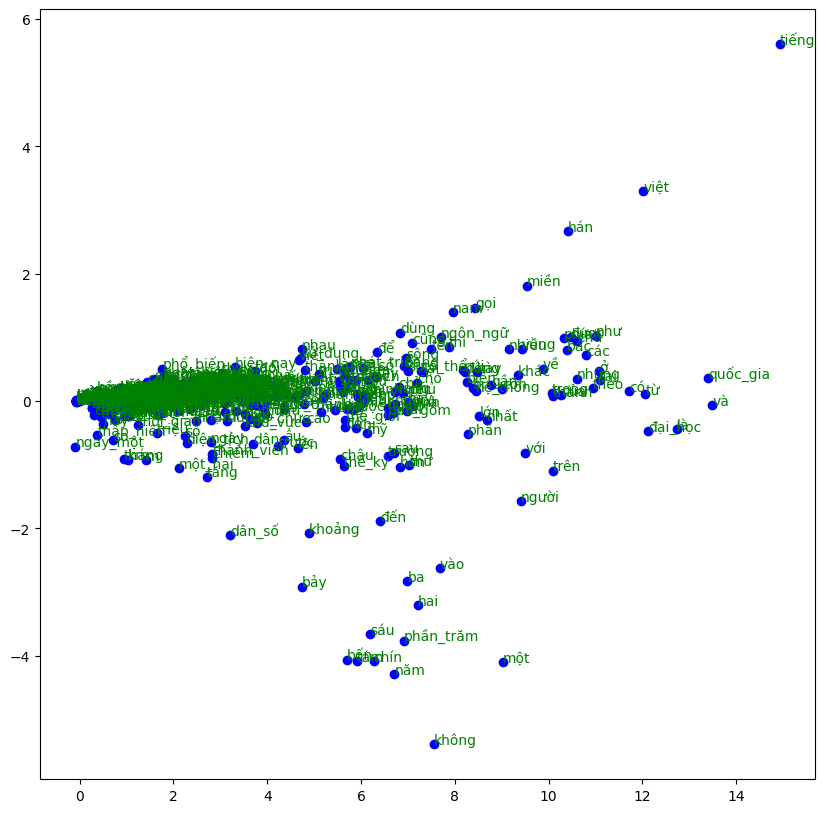

In [116]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from gensim.models import Word2Vec
from mpl_toolkits.mplot3d import Axes3D

# Tải mô hình Word2Vec đã huấn luyện
model = Word2Vec.load("word2vec_trained.model")

# Lấy danh sách các từ và vector embedding
words = list(model.wv.index_to_key)
embeddings = np.array([model.wv[word] for word in words])

# Sử dụng PCA để giảm xuống 2 chiều
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embeddings)

# Vẽ biểu đồ 3D
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)

# Chọn số lượng từ cần biểu diễn
num_words = 500
for i in range(num_words):
    ax.scatter(embeddings_2d[i, 0], embeddings_2d[i, 1], color='b')
    ax.text(embeddings_2d[i, 0], embeddings_2d[i, 1], words[i], color='g')

plt.show()


> Based on observations in the 2D plane, we are limited in distinguishing words that are close to each other. Therefore, it is necessary to implement the model on a 3D plane.

### 3D with Tensorflow's Embedding Projector

In [5]:
# Load model saved
model = Word2Vec.load("word2vec_trained.model")

log_dir = "embedding_projector"
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

with open('word_vectors.txt', 'w', encoding='utf-8') as out_v, open('words.txt', 'w', encoding='utf-8') as out_m:
    for word in model.wv.index_to_key:
        vector = model.wv[word]
        out_v.write('\t'.join([str(x) for x in vector]) + "\n")
        out_m.write(word + "\n")

embedding = tf.Variable(np.array([model.wv[word] for word in model.wv.index_to_key]), trainable=False)
embedding_dim = embedding.shape[1]
checkpoint = tf.train.Checkpoint(embedding=embedding)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

config = projector.ProjectorConfig()
embedding_config = config.embeddings.add()
embedding_config.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding_config.metadata_path = 'meta.tsv'

projector.visualize_embeddings(log_dir, config)

In [ ]:
!tensorboard --logdir=embedding_projector   

> Please click the link to watch the demo video:

[Demo Video of Visualization](https://drive.google.com/file/d/1Hz3EVYUG66uXxnlCJg67MhVxM1UtC_oT/view?usp=sharing)

---